In [28]:
import GEOparse
import gzip
import pandas as pd
from scipy.io import mmread
import os
import numpy as np
import scipy.stats as stats
import seaborn as sb
import matplotlib.pyplot as plt
import gseapy as gsea
from copy import deepcopy
from decoID2.database import Metabase
from scipy.cluster.hierarchy import fclusterdata
import matplotlib
matplotlib.rcParams['figure.dpi'] = 300

In [2]:
#function to generate heatmap
def generateHeatmap(data,sample_grouping,col_cluster,row_cluster,colormap,metaboliteColorMapper,sampleGroupColorMapper,vmin=-5,vmax=5):
  #order compounds by pathway
  pathways = data["pathway"]
  uniquePathways = list(set(pathways))
  uniquePathways.sort()

  #now cluster within a pathway
  correctOrder = []
  for pathway in uniquePathways:
      #filter data by pathway
      filt = data[data["pathway"] == pathway][data.columns.values[1:]]
      #if more than one, cluster, and append correct order
      if len(filt) > 2 and row_cluster:
          tmp = sb.clustermap(filt)
          plt.close()
          order = [filt.index.values[x] for x in tmp.dendrogram_row.reordered_ind]
          correctOrder += order
      else:
          correctOrder += list(filt.index.values)
  #reorder data
  data = data.loc[correctOrder,:]
  pathways = data["pathway"]

  #only take area columns
  areas = data[data.columns.values[1:]]

  #now order samples 
  #sort by group
  groups = sample_grouping["group"]
  uniqueGroups = list(set(groups))
  uniqueGroups.sort()

  #now cluster within a group
  correctOrder = []
  for group in uniqueGroups:
      #filter by group
      samps = sample_grouping[sample_grouping["group"] == group].index.values
      filt = areas[samps]
      #if more than two, cluster, and append ordering
      if len(filt) > 2 and col_cluster:
          tmp = sb.clustermap(filt)
          plt.close()
          order = [filt.columns.values[x] for x in tmp.dendrogram_col.reordered_ind]
          correctOrder += order
      else:
          correctOrder += list(filt.columns.values)

  #reorder columns
  areas = areas.loc[:,correctOrder]

  #grab group info
  groups = sample_grouping.loc[correctOrder,:]["group"].values

  #make heatmap of sorted rows, clustered columns
  row_colors = [metaboliteColorMapper[x] for x in pathways]
  col_colors = [sampleGroupColorMapper[x] for x in groups]
  f = sb.clustermap(areas,xticklabels=False,yticklabels=False,row_colors=row_colors,col_colors=col_colors,row_cluster=False,col_cluster=False,cmap=colormap,vmin=vmin,vmax=vmax)

  return f

In [3]:
metsOfInterest = {"AMP":"UDMBCSSLTHHNCD-KQYNXXCUSA-N","NAA":"OTCCIMWXFLJLIA-BYPYZUCNSA-N","Pal":"IPCSVZSSVZVIGE-UHFFFAOYSA-N","St":"QIQXTHQIDYTFRH-UHFFFAOYSA-N"}

In [4]:
db = Metabase("D:/DecoID2/data/database_files/DecoID2_DB.db")

In [5]:
genesForMets = {}
allGenes = []
for met,inchikey in metsOfInterest.items():
    genes = []
    cpd_info = db.selectCompoundsByID("InChIKey",inchikey)
    for index,row in cpd_info.iterrows():
        enzyme_ints = db.getMetaboliteEnzymeInteractions("compound_id",row["id"])
        for enz in enzyme_ints["enzyme_id"]:
            gene_ints = db.getGeneEnzymeInteraction("enzyme_id",enz)
            gene_ints = gene_ints[gene_ints["organism"] == "hsa"]
            for gene in gene_ints["gene_id"]:
                gene_info = db.getGene("id",gene)
                genes += list(gene_info["entrez"].values)
    genesForMets[met] = list(set(genes))
    allGenes += list(set(genes))
                
for x in list(set(allGenes)):
    print(x)

833
142827
50808
8833
123876
440
16
79611
271
51251
353
5634
22978
4677
23395
221264
117145
2272
113612
26289
30833
3251
10003
10380
570
5167
443
339983
8622
27115
8634
122970
100526794
390877
80222
83594
57494
4907
9374
2194
5538
5136
57176
10965
377841
50940
23438
51104
2346
5917
5150
204
318
55191
27304
3735
25973
57038
2193
22929
55902
115024
158
81616
641371
1615
10004
64172
102157402
23305
5153
203
10056
79731
122481
272
22875
93034
10352
26007
23205
57505
8565
3981
7407
54938
221823
51520
65985
81926
6296
2180
3978
124454
5169
10846
5137
84618
348158
54928
6897
10243
284716
116285
84532
2181
3980
5138
205
254827
79587
3376
3035
2058
54988
55644
5142
11164
51067
123283
11001
4141
2182
10998
83440
5144
80221
2617
22928
953
92935
11332
5631
53343
58489
5141
284486
7226
132
5143
27010
55157
56953
51703
7453
3141
158067
56985
10667
270
23181
5151
55699
341392
79717
89978
1633
5859
6301
55
5139
5140
956
445


In [6]:
assession = "GSE147352"
datadir = "../data/rnaseq/"

In [7]:
mapper = pd.read_csv(datadir + "gene_mapping_met_genes.txt",sep="\t")
mapper

,From,To,Species,Gene Name
0,5140,ENSG00000152270,Homo sapiens,phosphodiesterase 3B(PDE3B)
1,5141,ENSG00000065989,Homo sapiens,phosphodiesterase 4A(PDE4A)
2,5142,ENSG00000184588,Homo sapiens,phosphodiesterase 4B(PDE4B)
3,5143,ENSG00000285188,Homo sapiens,phosphodiesterase 4C(PDE4C)
4,5143,ENSG00000105650,Homo sapiens,phosphodiesterase 4C(PDE4C)
...,...,...,...,...
187,83440,ENSG00000159322,Homo sapiens,ADP dependent glucokinase(ADPGK)
188,54988,ENSG00000183549,Homo sapiens,acyl-CoA synthetase medium chain family member...
189,4677,ENSG00000134440,Homo sapiens,asparaginyl-tRNA synthetase 1(NARS1)
190,50940,ENSG00000128655,Homo sapiens,phosphodiesterase 11A(PDE11A)


In [8]:
for key,val in genesForMets.items():
    genes = []
    for gene in val:
        filt = mapper[mapper["From"] == int(gene)]["To"]
        genes += list(filt.values)
    genes = list(set(genes))
    genesForMets[key] = genes
    

In [9]:
gse = GEOparse.get_GEO(geo=assession, destdir=datadir + assession)

25-Oct-2022 11:05:06 DEBUG utils - Directory ../data/rnaseq/GSE147352 already exists. Skipping.
25-Oct-2022 11:05:06 INFO GEOparse - File already exist: using local version.
25-Oct-2022 11:05:06 INFO GEOparse - Parsing ../data/rnaseq/GSE147352\GSE147352_family.soft.gz: 
25-Oct-2022 11:05:06 DEBUG GEOparse - DATABASE: GeoMiame
25-Oct-2022 11:05:06 DEBUG GEOparse - SERIES: GSE147352
25-Oct-2022 11:05:06 DEBUG GEOparse - PLATFORM: GPL20301
25-Oct-2022 11:05:06 DEBUG GEOparse - SAMPLE: GSM4426487
25-Oct-2022 11:05:06 DEBUG GEOparse - SAMPLE: GSM4426488
25-Oct-2022 11:05:06 DEBUG GEOparse - SAMPLE: GSM4426489
25-Oct-2022 11:05:06 DEBUG GEOparse - SAMPLE: GSM4426490
25-Oct-2022 11:05:06 DEBUG GEOparse - SAMPLE: GSM4426491
25-Oct-2022 11:05:06 DEBUG GEOparse - SAMPLE: GSM4426492
25-Oct-2022 11:05:06 DEBUG GEOparse - SAMPLE: GSM4426493
25-Oct-2022 11:05:06 DEBUG GEOparse - SAMPLE: GSM4426494
25-Oct-2022 11:05:06 DEBUG GEOparse - SAMPLE: GSM4426495
25-Oct-2022 11:05:06 DEBUG GEOparse - SAMPLE: 

In [10]:
metadata = {}
for gsm_name, gsm in gse.gsms.items():
    metadata[gsm.metadata["title"][0]] = {"group":gsm.metadata["source_name_ch1"][0]}

metadata = pd.DataFrame.from_dict(metadata,orient="index")
metadata

,group
SYC100,glioblastoma tissues
SYC101,glioblastoma tissues
SYC102,glioblastoma tissues
SYC103,glioblastoma tissues
SYC105,glioblastoma tissues
...,...
SYC91,glioblastoma tissues
SYC92,glioblastoma tissues
SYC93,glioblastoma tissues
SYC94,glioblastoma tissues


In [11]:
sample_info = pd.read_csv(datadir + "sample_mapping.csv",index_col=0)
sample_info

,Type,IDH1 status,Tumor Location,Subtype
sample ID,,,,
SYC64,Normal,NaN,NaN,NaN
SYC66,Normal,NaN,NaN,NaN
SYC67,Normal,NaN,NaN,NaN
SYC68,Normal,NaN,NaN,NaN
SYC69,Normal,NaN,NaN,NaN
...,...,...,...,...
SYC214,LGG,Positive,NaN,Proneural
SYC218,LGG,NaN,NaN,Proneural
SYC219,LGG,Positive,NaN,Proneural


In [12]:
gse.download_supplementary_files(datadir + assession + "/")
pass

25-Oct-2022 11:05:23 DEBUG utils - Directory D:\imaging\data\rnaseq\GSE147352 already exists. Skipping.
25-Oct-2022 11:05:23 INFO GEOTypes - Downloading SRA files for GSM4426487 series

25-Oct-2022 11:05:23 DEBUG utils - Directory D:\imaging\data\rnaseq\GSE147352\Supp_GSM4426487_SYC64 already exists. Skipping.
25-Oct-2022 11:05:23 INFO downloader - File D:\imaging\data\rnaseq\GSE147352\Supp_GSM4426487_SYC64\GSM4426487_htseq_count_on_SYC64.txt.gz already exist. Use force=True if you would like to overwrite it.
25-Oct-2022 11:05:23 ERROR GEOTypes - Cannot download GSM4426487 SRA file (argument of type 'NoneType' is not iterable)
25-Oct-2022 11:05:23 INFO GEOTypes - Downloading SRA files for GSM4426488 series

25-Oct-2022 11:05:23 DEBUG utils - Directory D:\imaging\data\rnaseq\GSE147352\Supp_GSM4426488_SYC66 already exists. Skipping.
25-Oct-2022 11:05:23 INFO downloader - File D:\imaging\data\rnaseq\GSE147352\Supp_GSM4426488_SYC66\GSM4426488_htseq_count_on_SYC66.txt.gz already exist. Use 

In [13]:
data = pd.read_csv(datadir + assession + "/GSE147352_DESeq_normalized_counts.csv",index_col=0)
data = data.fillna(0.0)
data

,SYC64,SYC66,SYC67,SYC68,SYC69,SYC70,SYC71,SYC72,SYC73,SYC76,...,SYC208,SYC209,SYC211,SYC212,SYC213,SYC214,SYC218,SYC219,SYC220,SYC221
ID,,,,,,,,,,,,,,,,,,,,,
ENSG00000000003,209.550385,144.715159,142.586711,186.927574,135.702602,183.585424,166.664151,170.525328,151.002744,100.691553,...,296.661573,203.692325,546.992417,657.016555,627.252491,614.565299,487.859232,545.081715,483.122489,792.175792
ENSG00000000005,0.735265,6.291963,3.727757,1.153874,0.000000,13.838097,6.289213,5.198943,5.075722,1.882085,...,0.988872,3.433017,7.758758,0.000000,0.889720,1.812877,0.000000,5.379096,0.000000,13.787870
ENSG00000000419,394.101777,588.298579,500.451399,455.780197,366.790367,464.037529,334.376505,293.220380,312.156933,375.475976,...,373.793583,441.714818,218.538342,236.773891,255.349595,329.943612,217.319112,309.298012,248.089927,238.154115
ENSG00000000457,436.011853,404.782980,431.487891,390.009384,403.174398,468.650228,420.329086,413.835856,398.444216,392.414742,...,449.936720,398.229939,375.006621,368.177202,358.557098,406.990884,556.603032,486.808176,371.632684,394.834453
ENSG00000000460,77.202773,121.644626,91.330050,107.310274,168.153225,100.556840,107.964828,85.262664,83.749421,97.868425,...,202.718742,155.630091,270.263393,327.268624,379.910374,329.037173,423.550515,382.812323,320.407639,387.313797
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000284743,0.735265,2.097321,5.591636,0.000000,2.950057,0.000000,2.096404,2.079577,0.000000,2.823128,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.896516,1.004413,0.000000
ENSG00000284744,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
ENSG00000284745,0.000000,1.048661,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,1.144339,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [14]:
set(metadata["group"].values)

{'Normal brain tissues', 'glioblastoma tissues', 'lower grade glioma tissues'}

In [15]:
#relSamps = [x for x in metadata.index.values if ("glioblastoma" in metadata.at[x,"group"] and sample_info.at[x,"IDH1 status"] == "Mut") or "Normal" in metadata.at[x,"group"]]
relSamps = [x for x in metadata.index.values if ("glioblastoma" in metadata.at[x,"group"]) or "Normal" in metadata.at[x,"group"]]
relSamps

['SYC100',
 'SYC101',
 'SYC102',
 'SYC103',
 'SYC105',
 'SYC106',
 'SYC107',
 'SYC108',
 'SYC110',
 'SYC111',
 'SYC113',
 'SYC114',
 'SYC115',
 'SYC116',
 'SYC117',
 'SYC118',
 'SYC119',
 'SYC120',
 'SYC121',
 'SYC122',
 'SYC125',
 'SYC126',
 'SYC127',
 'SYC128',
 'SYC129',
 'SYC130',
 'SYC132',
 'SYC133',
 'SYC134',
 'SYC137',
 'SYC138',
 'SYC139',
 'SYC141',
 'SYC142',
 'SYC143',
 'SYC144',
 'SYC145',
 'SYC146',
 'SYC147',
 'SYC149',
 'SYC150',
 'SYC151',
 'SYC152',
 'SYC153',
 'SYC154',
 'SYC155',
 'SYC156',
 'SYC157',
 'SYC158',
 'SYC159',
 'SYC160',
 'SYC161',
 'SYC162',
 'SYC163',
 'SYC166',
 'SYC167',
 'SYC171',
 'SYC172',
 'SYC173',
 'SYC174',
 'SYC175',
 'SYC176',
 'SYC177',
 'SYC179',
 'SYC186',
 'SYC187',
 'SYC188',
 'SYC191',
 'SYC192',
 'SYC193',
 'SYC195',
 'SYC196',
 'SYC197',
 'SYC199',
 'SYC203',
 'SYC204',
 'SYC205',
 'SYC206',
 'SYC64',
 'SYC66',
 'SYC67',
 'SYC68',
 'SYC69',
 'SYC70',
 'SYC71',
 'SYC72',
 'SYC73',
 'SYC76',
 'SYC77',
 'SYC78',
 'SYC81',
 'SYC82',
 '

In [16]:
mapping = pd.read_csv(datadir + assession + "/" + "gene_mapping.csv",index_col=0)
mapping

,Name,Species
ENSEMBL_GENE_ID,,
ENSG00000121410,alpha-1-B glycoprotein(A1BG),Homo sapiens
ENSG00000175899,alpha-2-macroglobulin(A2M),Homo sapiens
ENSG00000257572,small RNA binding exonuclease protection facto...,Homo sapiens
ENSG00000256069,alpha-2-macroglobulin pseudogene 1(A2MP1),Homo sapiens
ENSG00000160124,mitochondrial matrix import factor 23(MIX23),Homo sapiens
...,...,...
ENSG00000189079,AT-rich interaction domain 2(ARID2),Homo sapiens
ENSG00000139780,"methyltransferase 21C, AARS1 lysine(METTL21C)",Homo sapiens
ENSG00000196353,copine 4(CPNE4),Homo sapiens


In [17]:
data = data.loc[mapping.index.values,relSamps]
data

,SYC100,SYC101,SYC102,SYC103,SYC105,SYC106,SYC107,SYC108,SYC110,SYC111,...,SYC81,SYC82,SYC83,SYC86,SYC90,SYC91,SYC92,SYC93,SYC94,SYC95
ID,,,,,,,,,,,,,,,,,,,,,
ENSG00000121410,16.642178,5.837010,34.794689,20.838822,13.215281,12.457947,9.467646,33.614351,1.847000,17.811132,...,26.644806,25.600368,34.442796,4.935297,29.622791,26.499562,3.380666,6.249402,1.993330,5.309651
ENSG00000175899,17709.358100,17917.119230,17385.166410,46858.792160,8040.990144,41567.378690,31900.288010,12304.145180,29214.922470,3774.912196,...,2832.827364,2445.508817,2601.068942,24238.890030,5210.020628,7801.667455,29495.184040,15215.508570,18181.164330,104247.568600
ENSG00000257572,0.000000,20.846464,1.739734,0.000000,2.033120,0.000000,0.000000,5.171439,0.000000,7.333995,...,9.689020,16.168653,21.686205,0.822550,10.771924,15.703444,4.507555,3.571087,0.996665,8.495442
ENSG00000256069,0.000000,5.003151,13.917876,1.543616,0.000000,7.666429,2.840294,5.171439,0.000000,4.190855,...,0.000000,2.694776,0.000000,1.645099,0.897660,3.925861,2.253777,1.785543,5.979990,9.557372
ENSG00000160124,113.374840,162.602422,173.973445,150.502602,84.374486,160.995012,103.197346,182.293209,208.711000,183.349885,...,116.268246,146.865268,146.700799,195.766792,125.672448,145.256860,164.525746,191.053150,187.373034,149.732165
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000189079,1745.348461,2469.055244,1426.582253,1843.849826,2137.825825,1023.468288,1526.184611,2280.604402,1446.200999,2435.934182,...,913.190181,1152.016550,1211.876162,1587.520625,2132.840974,1406.439736,1636.242348,2278.353451,2162.763216,1683.159444
ENSG00000139780,0.000000,0.000000,0.000000,0.771808,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,24.222551,16.168653,6.378296,0.000000,2.692981,1.962931,0.000000,0.000000,0.000000,0.000000
ENSG00000196353,14.561906,1014.805887,174.843313,250.837670,31.513362,42.165360,8.520882,7.757158,889.330499,90.103372,...,1461.830966,990.330017,933.782475,322.439422,122.979467,363.142151,51.836879,1646.271067,1171.081465,165.661119


In [18]:
glioSamps = [x for x in relSamps if "glioblastoma" in metadata.at[x,"group"]]
contSamps = [x for x in relSamps if "Normal" in metadata.at[x,"group"]]
print(len(glioSamps))
print(len(contSamps))

85
15


In [19]:
rename = {}
for x in range(len(glioSamps)):
    rename[glioSamps[x]] = "Glioblastoma_" + str(x)
for x in range(len(contSamps)):
    rename[contSamps[x]] = "normal_brain_" + str(x)

In [20]:
#get gene IDs
symbols = {}
for index,row in mapping.iterrows():
    sym = row["Name"].split("(")[-1][:-1]
    symbols[index] = sym
symbols_rev = {val:key for key,val in symbols.items()}

In [21]:
filtered = data[glioSamps + contSamps].rename(mapper=rename,axis=1).loc[list(set(data.index.values)),:]
filtered = filtered.rename(mapper=symbols,axis=0)
filtered.to_csv(datadir + assession + "/filtered_renamed.csv")
filtered

,Glioblastoma_0,Glioblastoma_1,Glioblastoma_2,Glioblastoma_3,Glioblastoma_4,Glioblastoma_5,Glioblastoma_6,Glioblastoma_7,Glioblastoma_8,Glioblastoma_9,...,normal_brain_5,normal_brain_6,normal_brain_7,normal_brain_8,normal_brain_9,normal_brain_10,normal_brain_11,normal_brain_12,normal_brain_13,normal_brain_14
ID,,,,,,,,,,,,,,,,,,,,,
NACA3P,57.207488,124.244928,47.842698,77.180821,156.550251,47.915182,69.113819,46.542947,128.366500,124.677922,...,37.824133,2.096404,56.148583,20.302890,46.111085,45.252756,24.419648,21.800296,16.168653,12.756591
LCNL1,124.816338,13.341737,248.782027,43.993068,298.868660,20.124376,87.102348,147.385999,3.694000,198.017875,...,321.966397,384.690211,535.491120,513.916902,244.671062,209.425545,900.038463,496.562300,330.110006,274.266710
HVCN1,184.104099,183.448887,135.699287,177.515889,38.629283,312.406987,243.318514,202.978963,193.935000,78.578522,...,52.584770,92.241794,63.427104,77.404768,63.990893,74.719667,147.680730,36.333827,64.674613,103.328389
HYI-AS1,1.040136,12.507879,8.698672,6.946274,7.115920,3.833215,0.000000,24.564333,2.770500,10.477136,...,11.070478,0.000000,1.039789,6.344653,0.941043,8.419117,10.465564,3.633383,2.694776,15.307909
RN7SL482P,9.361225,3.335434,5.219203,3.859041,0.000000,2.874911,4.733823,3.878579,0.923500,11.524850,...,3.690159,5.241011,5.198943,8.882514,7.528340,1.052390,12.791244,2.422255,2.694776,5.102636
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RNU6-1038P,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
FYB2,0.000000,0.833859,1.739734,0.771808,9.149041,6.708125,1.893529,292.186278,0.000000,13.620277,...,16.605717,11.530224,10.397886,21.571821,29.172319,21.047793,25.582489,23.011424,20.210817,17.859228
LINC02268,1.040136,5.837010,12.178141,27.013288,11.182161,171.536352,1.893529,215.907560,1.847000,6.286282,...,5.535239,18.867640,7.278520,3.806792,3.764170,6.314338,30.233850,4.844510,6.736939,10.205273


c:\users\ethan\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in log2


AMP 0.4225352112676056
NAA 0.625
Pal 0.2727272727272727
St 0.14285714285714285


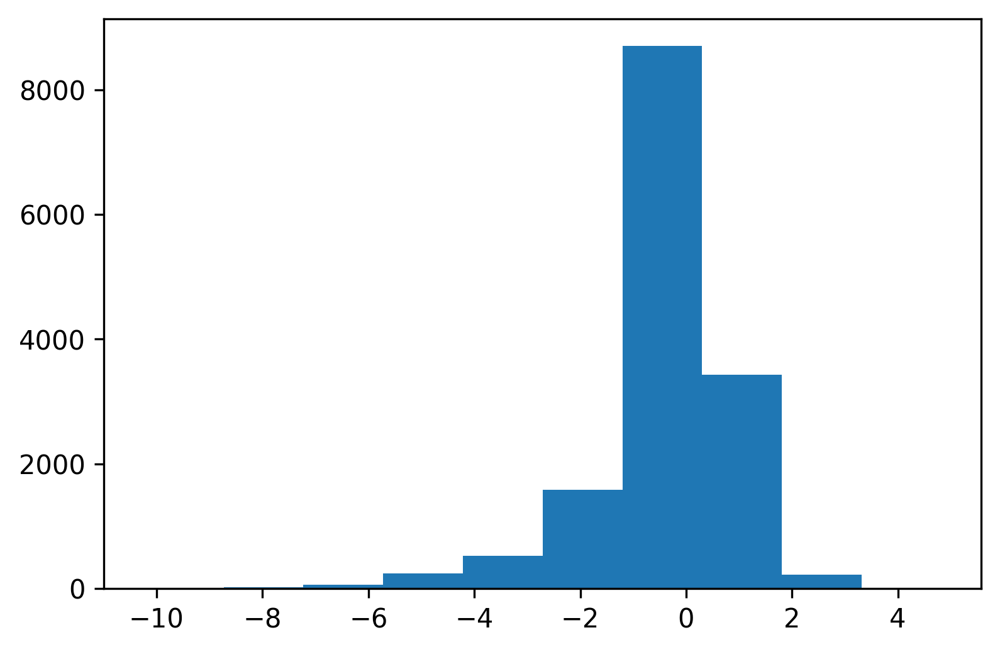

<Figure size 1800x1200 with 0 Axes>

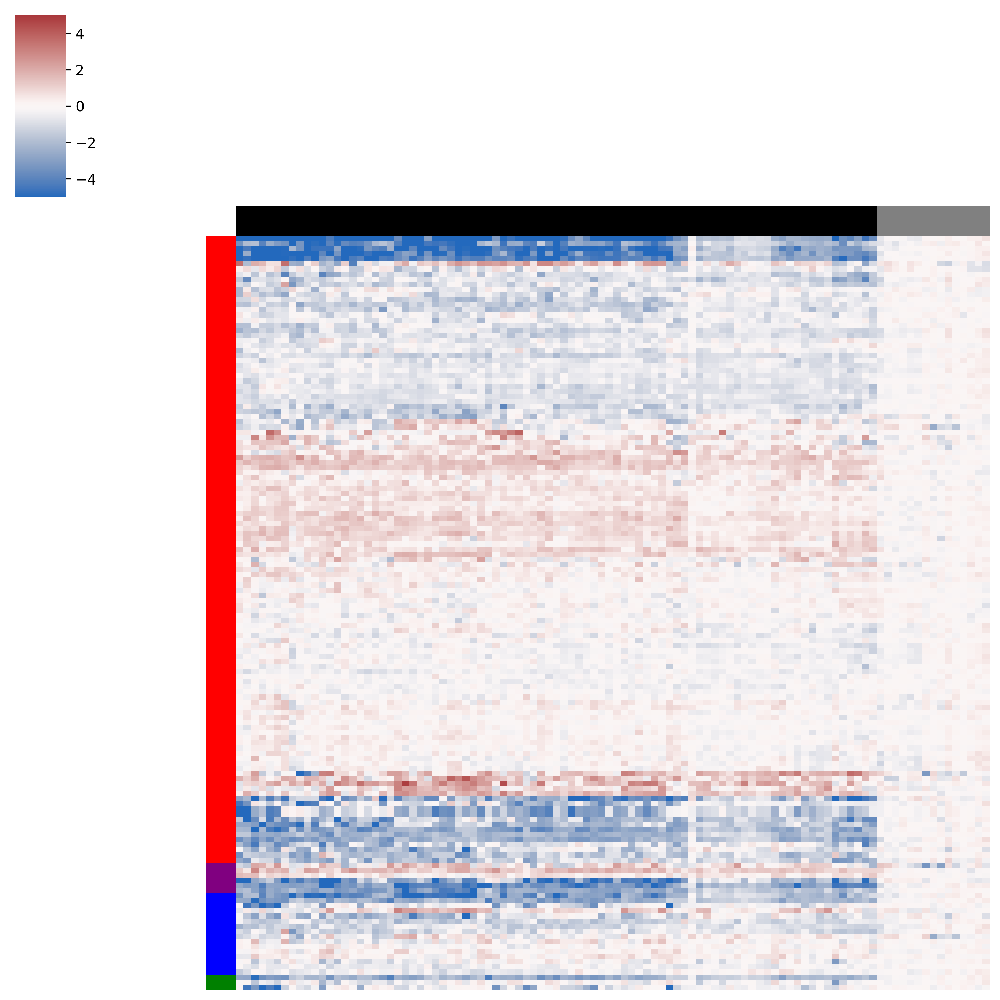

In [30]:
plot_df = pd.DataFrame()
sample_info = pd.DataFrame(index=filtered.columns.values)
groups = []

for col in filtered.columns.values:
    if "normal" in col:
        groups.append("Normal")
    else:
        groups.append("GBM")
sample_info["group"] = groups

numGenes = np.sum([len(genes) for _,genes in genesForMets.items()])

for met,genes in genesForMets.items():
    genes_conv = [symbols[x] for x in genes if x in symbols]
    filt = filtered.loc[genes_conv]
    normed = deepcopy(filt)
    sigGenes = []
    sigCount = 0
    for index,row in filt.iterrows():
        norm = np.mean(row[[rename[x] for x in contSamps]].values)
        if norm > 1e-6 and min(row.values) > 1e-6 and all(not pd.isna(x) for x in row.values):
            if not pd.isna(np.sum(np.log2(normed.loc[index,:].values / norm))):
                normed.loc[index,:] = np.log2(normed.loc[index,:].values / norm)
                ints = [row[[rename[x] for x in glioSamps]].values,row[[rename[x] for x in contSamps]].values]
                stat,p = stats.ranksums(*ints)
                sigGenes.append(index)
                if p < 0.05/numGenes:
                    sigCount += 1 

    print(met,sigCount/len(filt))
    normed = normed.loc[sigGenes,:]
    normed["pathway"] = met
    normed = normed[["pathway"] + filtered.columns.values.tolist()]
    plot_df = pd.concat((plot_df,normed),axis=0,ignore_index=False)
plot_df = plot_df.reset_index()
plot_df = plot_df[["pathway"] + filtered.columns.values.tolist()]
plot_df.to_csv("tmp.csv")
plt.hist(plot_df[plot_df.columns.values[1:]].values.flatten())
plt.figure()
metaboliteColorMapper = {"AMP":"red","NAA":"purple","Pal":"blue","St":"green"}
sampleGroupColorMapper = {"GBM":"black","Normal":"grey"}
f = generateHeatmap(plot_df,sample_info,True,True,"vlag",metaboliteColorMapper,sampleGroupColorMapper)
f.savefig("../figures_presentations/RNA_seq_heatmap.png")


In [31]:
gsea.get_library_name("HUMAN")
pass

In [44]:
gs_res = gsea.gsea(data=filtered, # or data='./P53_resampling_data.txt'
                 gene_sets="GO_Biological_Process_2021", # enrichr library names
                 cls= ["glioblastoma" for _ in glioSamps] + ["normal brain" for _ in contSamps], # cls=class_vector
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='t_test',
                 max_size=200,
                 min_size = 15,
                 processes=4, seed= 7,
                 format='png')

2022-10-25 12:34:46,923 Warning: dropping duplicated gene names, only keep the first values


In [45]:
gs_res.res2d[gs_res.res2d["pval"] < 0.05].to_csv(datadir + assession + "/pathway_analysis.csv")
gs_res.res2d.to_csv(datadir + assession + "/pathway_analysis_all.csv")
gs_res.res2d[gs_res.res2d["pval"] < 0.05]

,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
Term,,,,,,,,
regulation of release of sequestered calcium ion into cytosol (GO:0051279),-0.620780,-2.270810,0.0,0.003890,52,51,KLHL22;FAM86B1;CHCHD7;ZNF681;RNU6-821P;MIR6812...,RN7SL865P;EOLA2;USP10;ZBBX;MYO1E;LINC01269;DEP...
synapse organization (GO:0050808),-0.532758,-2.169034,0.0,0.004299,126,126,ZFP62;ARHGAP10;KLHL22;CEP128;NAGS;TRAJ16;LOC10...,TTC1;SMC5;MT-TY;MIR6509;DIS3;TGIF2;MSH6;GPRC5C...
regulation of ryanodine-sensitive calcium-release channel activity (GO:0060314),-0.678309,-2.182344,0.0,0.004376,25,25,FAM86B1;ZNF681;STPG3-AS1;LOC112268176;GK5;TSPA...,EOLA2;USP10;ZBBX;IGHEP2;CDCA5;RPL36AP26;ESR1;R...
regulation of sodium ion transmembrane transporter activity (GO:2000649),-0.704938,-2.174365,0.0,0.004538,40,40,ARHGAP10;GK;NAMPT;MINDY3;MEOX1;RPSAP15;LGALSL;...,KYAT1;PTH2;RAD1;NPTN;YDJC;OR5H14;RPS15A;LSAMP-...
regulation of calcium ion transmembrane transporter activity (GO:1901019),-0.781688,-2.147342,0.0,0.004566,29,29,FAM86B1;LOC112268176;RNU7-93P;LGALSL;LINC01738...,EOLA2;USP10;ZBBX;ZNF12;TEX11;IGHEP2;CDCA5;OR52...
...,...,...,...,...,...,...,...,...
"DNA damage response, signal transduction by p53 class mediator (GO:0030330)",0.556798,1.884775,0.0,0.540157,74,74,SLC8A3;MIR4428;CRB3;KCNK18;MIR6894;TRAJ27;LINC...,SLC8A3;MIR4428;CRB3;KCNK18;MIR6894;TRAJ27;LINC...
RNA catabolic process (GO:0006401),0.582446,1.895119,0.0,0.599921,49,49,EIF2S3;NEXN;MTCL1;BLTP1;FNDC3B;NOBOX;TMEM39B;C...,EIF2S3;NEXN;MTCL1;BLTP1;FNDC3B;NOBOX;TMEM39B;C...
regulation of transcription initiation from RNA polymerase II promoter (GO:0060260),0.561486,1.895357,0.0,0.799895,64,64,SLC8A3;RPL31P7;MIR4428;NDUFA12;LOC349160;APBA3...,SLC8A3;RPL31P7;MIR4428;NDUFA12;LOC349160;APBA3...


In [47]:
FAGenes = []
for index,row in gs_res.res2d.iterrows():
    if "atty" in index and "fatty liver" not in index:
        print(index,row["pval"])
        FAGenes += row["genes"].split(";")
#FAGenes = list(set([symbols_rev[x] for x in FAGenes if x in symbols_rev]))
FAGenes = list(set([x for x in FAGenes if x in symbols_rev]))
mapping.loc[list(set([symbols_rev[x] for x in FAGenes if x in symbols_rev])),:]

cellular response to fatty acid (GO:0071398) 0.09090909090909091
long-chain fatty acid metabolic process (GO:0001676) 0.05714285714285714
long-chain fatty acid biosynthetic process (GO:0042759) 0.10714285714285714
regulation of fatty acid metabolic process (GO:0019217) 0.12195121951219512
regulation of fatty acid oxidation (GO:0046320) 0.21212121212121213
long-chain fatty-acyl-CoA metabolic process (GO:0035336) 0.34210526315789475
fatty acid derivative biosynthetic process (GO:1901570) 0.4482758620689655
fatty acid oxidation (GO:0019395) 0.22807017543859648
fatty acid metabolic process (GO:0006631) 0.3333333333333333
fatty acid beta-oxidation (GO:0006635) 0.29411764705882354
fatty acid beta-oxidation using acyl-CoA oxidase (GO:0033540) 0.4166666666666667
medium-chain fatty acid metabolic process (GO:0051791) 0.47058823529411764
fatty acid transport (GO:0015908) 0.4117647058823529
negative regulation of fatty acid metabolic process (GO:0045922) 0.4032258064516129
fatty-acyl-CoA metaboli

,Name,Species
ENSEMBL_GENE_ID,,
ENSG00000121988,zinc finger RANBP2-type containing 3(ZRANB3),Homo sapiens
ENSG00000110002,von Willebrand factor A domain containing 5A(V...,Homo sapiens
ENSG00000253739,"RNA, U6 small nuclear 323, pseudogene(RNU6-323P)",Homo sapiens
ENSG00000005022,solute carrier family 25 member 5(SLC25A5),Homo sapiens
ENSG00000023697,deoxyribose-phosphate aldolase(DERA),Homo sapiens
...,...,...
ENSG00000100997,"abhydrolase domain containing 12, lysophosphol...",Homo sapiens
ENSG00000137449,cytoplasmic polyadenylation element binding pr...,Homo sapiens
ENSG00000143624,integrator complex subunit 3(INTS3),Homo sapiens


In [23]:
#FAGenes = [x for x in data.index.values if any(y in mapping.at[x,"Name"] for y in ["FADS1","FASN","FADS2","ELOVL","ACLY","ACAC","APOE","SREBF"])]
#FAGenes = [x for x in data.index.values if "FASN" in mapping.at[x,"Name"]]
#mapping.loc[FAGenes,:]

In [49]:
sigGenes = []
normed = deepcopy(filtered)
for index,row in filtered.loc[FAGenes,:].iterrows():
    norm = np.mean(row[[rename[x] for x in contSamps]].values)
    if norm > 1e-6 and min(row.values) > 1e-6 and all(not pd.isna(x) for x in row.values):
        ints = [row[[rename[x] for x in glioSamps]].values,row[[rename[x] for x in contSamps]].values]
        stat,p = stats.ranksums(*ints)
        if p < 0.05/len(FAGenes):
            if not pd.isna(np.sum(np.log2(normed.loc[index,:].values / norm))):
                sigGenes.append(index)
                normed.loc[index,:] = np.log2(normed.loc[index,:].values / norm)

print(len(sigGenes)/len(FAGenes))
sigs = normed.loc[sigGenes,:]
sigs

0.30990415335463256


,Glioblastoma_0,Glioblastoma_1,Glioblastoma_2,Glioblastoma_3,Glioblastoma_4,Glioblastoma_5,Glioblastoma_6,Glioblastoma_7,Glioblastoma_8,Glioblastoma_9,...,normal_brain_5,normal_brain_6,normal_brain_7,normal_brain_8,normal_brain_9,normal_brain_10,normal_brain_11,normal_brain_12,normal_brain_13,normal_brain_14
ID,,,,,,,,,,,,,,,,,,,,,
ZNF385A,-0.153286,-1.274183,0.011576,-1.507123,-1.179227,-1.181378,-1.335015,-1.813497,-0.611469,-1.628718,...,-0.097525,0.049609,0.252899,0.272142,0.154969,-0.207256,0.079687,0.169797,0.363020,0.337105
LDAH,0.195436,0.910788,0.452970,1.254422,0.574144,0.966967,0.123306,0.718566,0.630311,0.561239,...,0.026673,0.021959,0.303415,0.114126,-0.403570,-0.315297,0.059087,-0.015997,-0.089450,-0.245616
HECTD4,-1.712689,-1.501670,-1.357806,-1.790293,-1.133513,-1.737056,-1.880656,-1.545635,-2.148949,-0.892643,...,-0.028334,0.128543,0.183701,0.109301,-0.102879,-0.095635,-0.334041,0.176729,-0.013119,-0.003283
LRRC75A,-2.357076,0.228869,-1.192290,-1.509232,-2.857278,-1.820429,-2.214469,-1.331085,-1.873800,-3.316230,...,0.223585,0.082474,0.297307,0.054657,0.205990,-0.460140,-0.502856,0.507586,-0.319103,-0.561911
SLC35B2,0.818368,0.982942,0.694232,1.236666,0.838979,1.108334,1.059606,0.595937,1.613931,0.918313,...,0.255096,0.685842,0.184250,-0.539075,0.297124,-0.459570,0.297069,-0.075822,-0.506971,-0.458514
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SERPINA1,4.353914,2.083705,3.467136,3.714208,-0.233422,3.693025,2.538429,1.128878,3.095935,-1.974145,...,1.354193,-1.236506,-4.418058,-2.060346,-2.076590,2.291413,0.465771,-2.519926,-2.366111,-1.985602
NEDD4L,-1.476237,-2.203299,-1.607578,-2.192898,-3.032772,-1.806960,-2.651322,-2.584941,-2.270905,-2.819034,...,-0.033823,-0.001982,0.030685,-0.238591,-0.089336,-0.308743,-0.730669,-0.019694,0.019928,0.049575
CFAP410,-1.019490,-0.725081,-0.830509,-0.888069,-0.074197,-0.635208,-1.234619,-0.630409,-1.423525,0.235289,...,-0.045738,-0.025624,0.079563,0.201463,-0.146857,-0.367005,0.240926,0.299624,-0.205525,0.006784


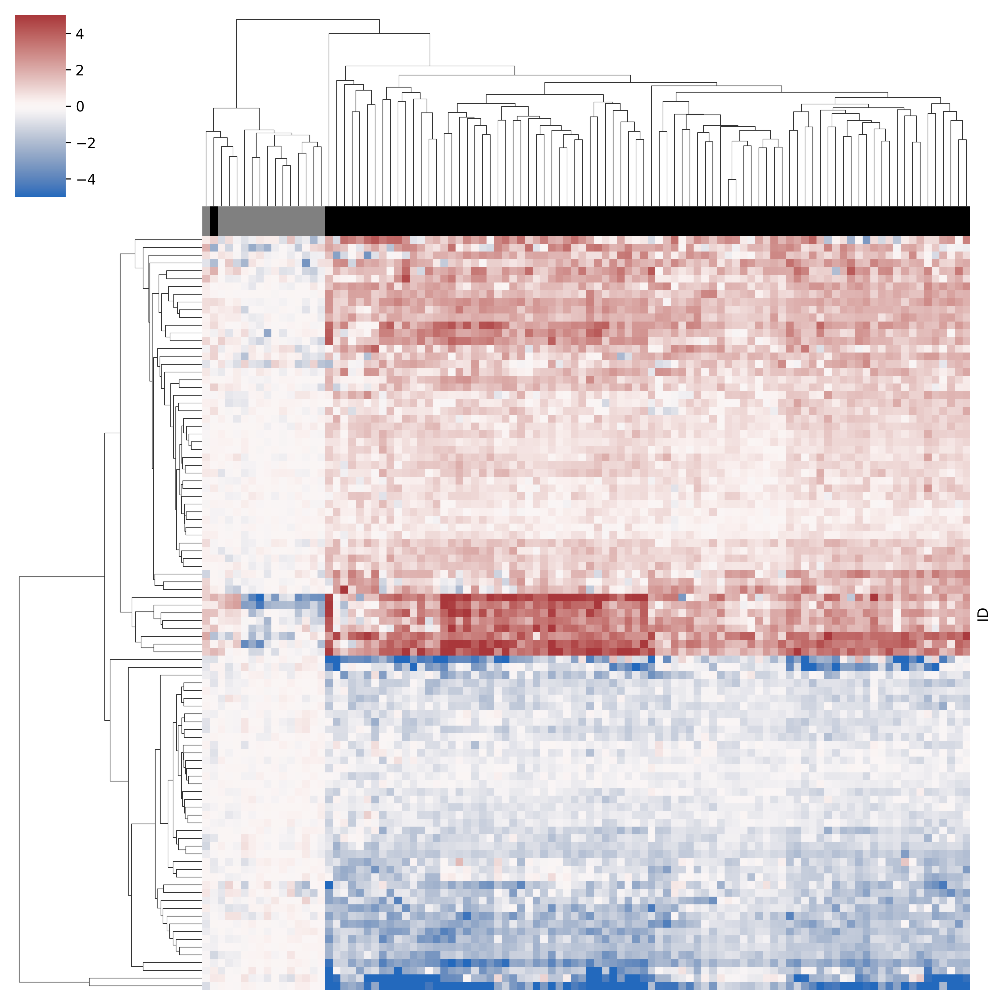

In [50]:
colors = []
for col in sigs.columns.values:
    if "normal" in col:
        colors.append("grey")
    else:
        colors.append("black")
f = sb.clustermap(sigs,cmap="vlag",yticklabels=False,xticklabels=False,col_colors = colors,vmin=-5,vmax = 5)
f.savefig("../figures_presentations/RNA_seq_heatmap_lipid_genes.png")

(array([   7.,    8.,   40.,   73.,  332., 2398., 4697., 1763.,  328.,
          54.]),
 array([-11.37046917,  -9.57053299,  -7.7705968 ,  -5.97066062,
         -4.17072444,  -2.37078826,  -0.57085208,   1.22908411,
          3.02902029,   4.82895647,   6.62889265]),
 <BarContainer object of 10 artists>)

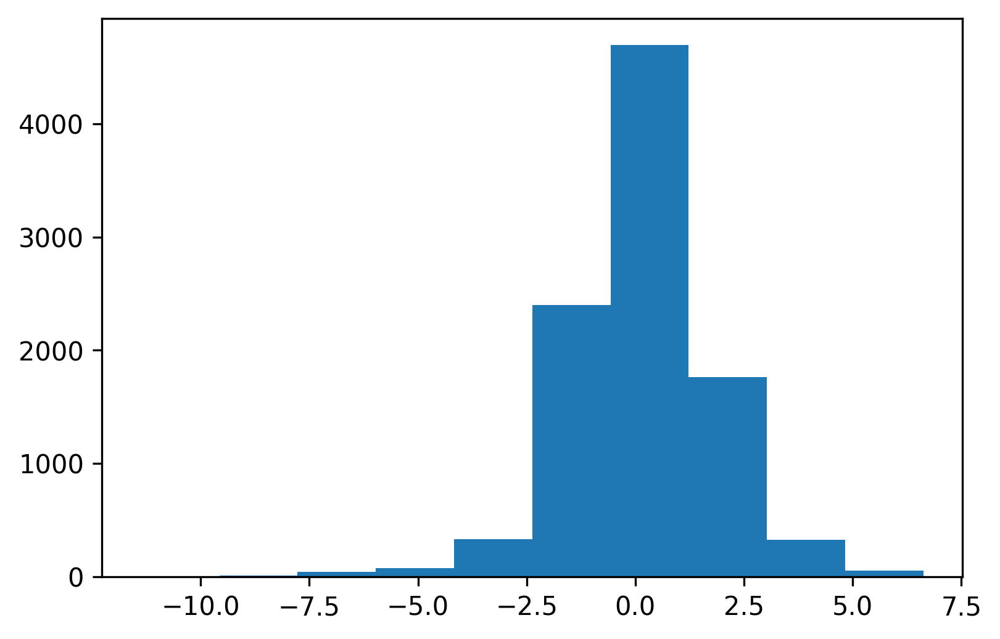

In [51]:
plt.hist(sigs.values.flatten())

c:\users\ethan\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
c:\users\ethan\appdata\local\programs\python\python37\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 23.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


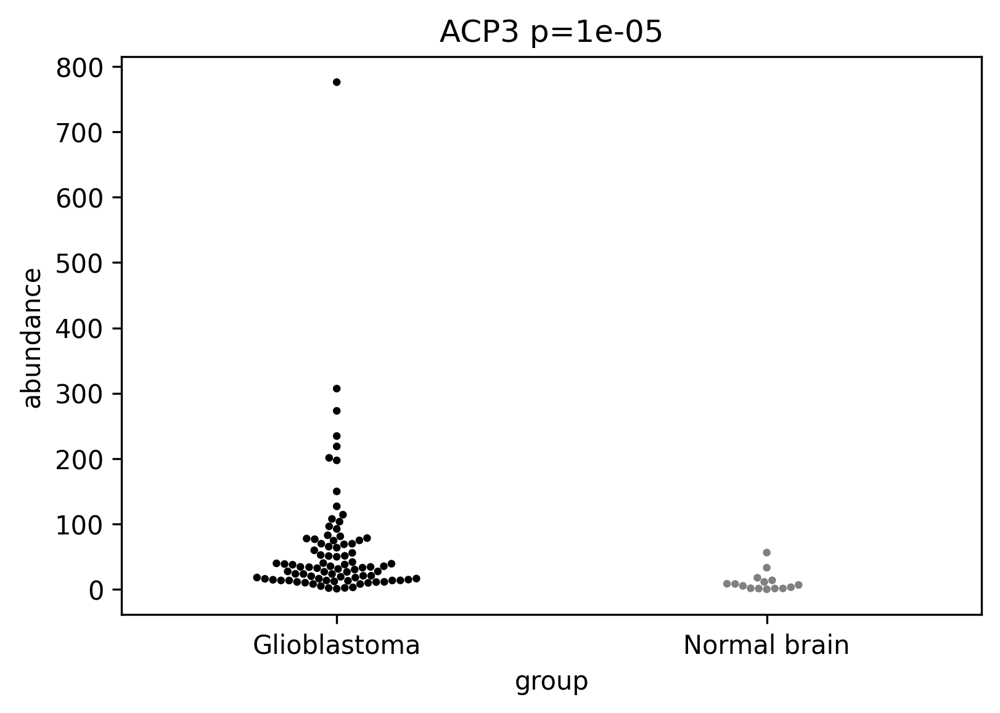

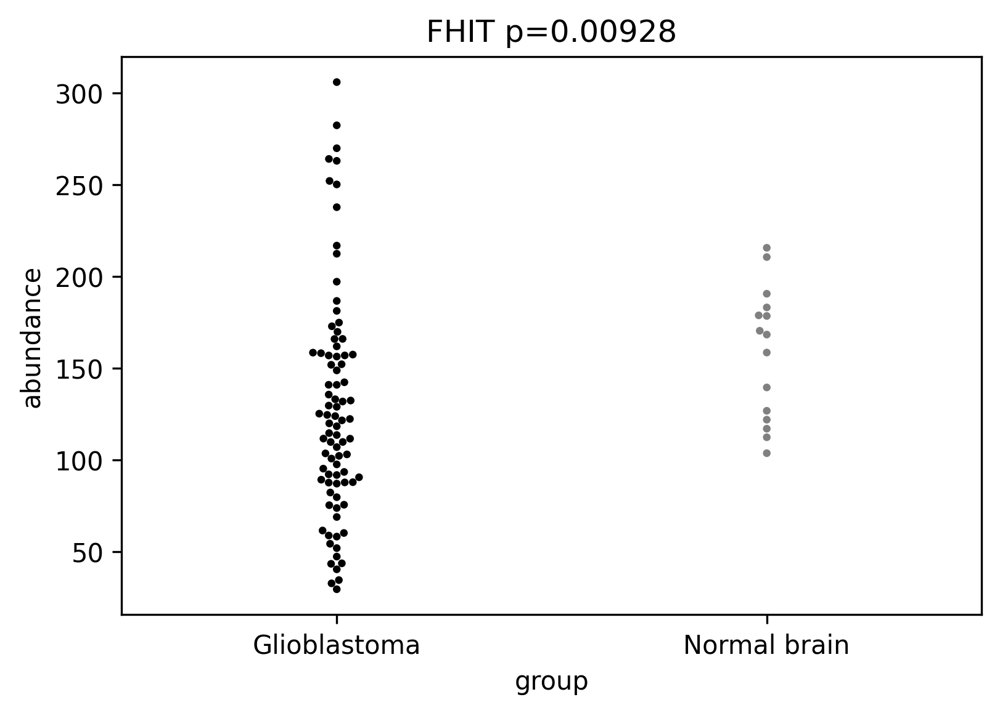

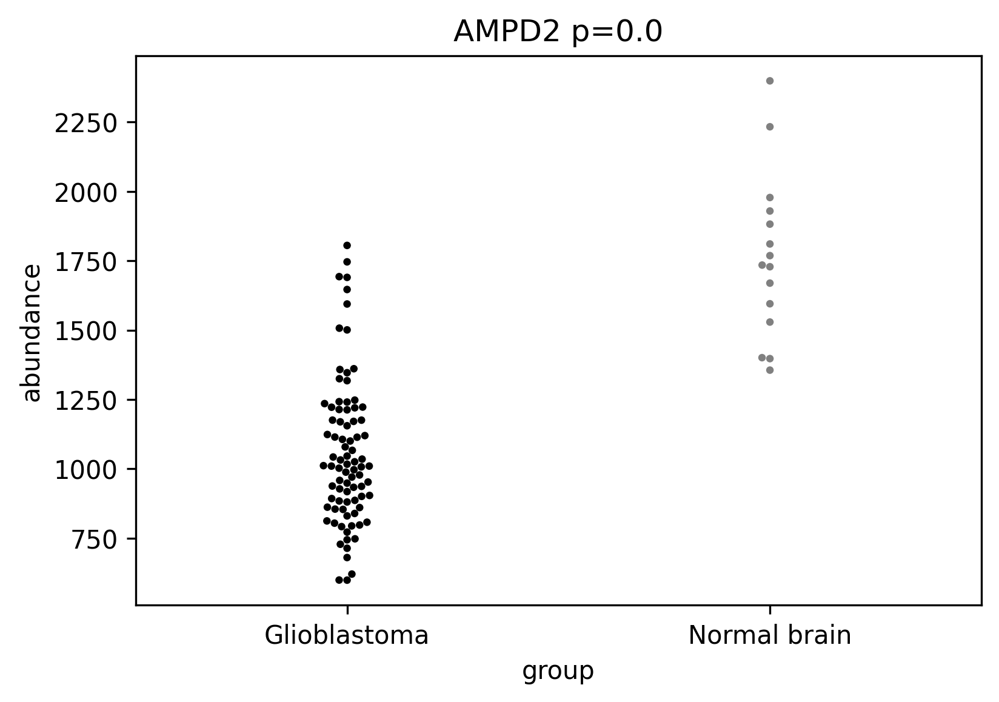

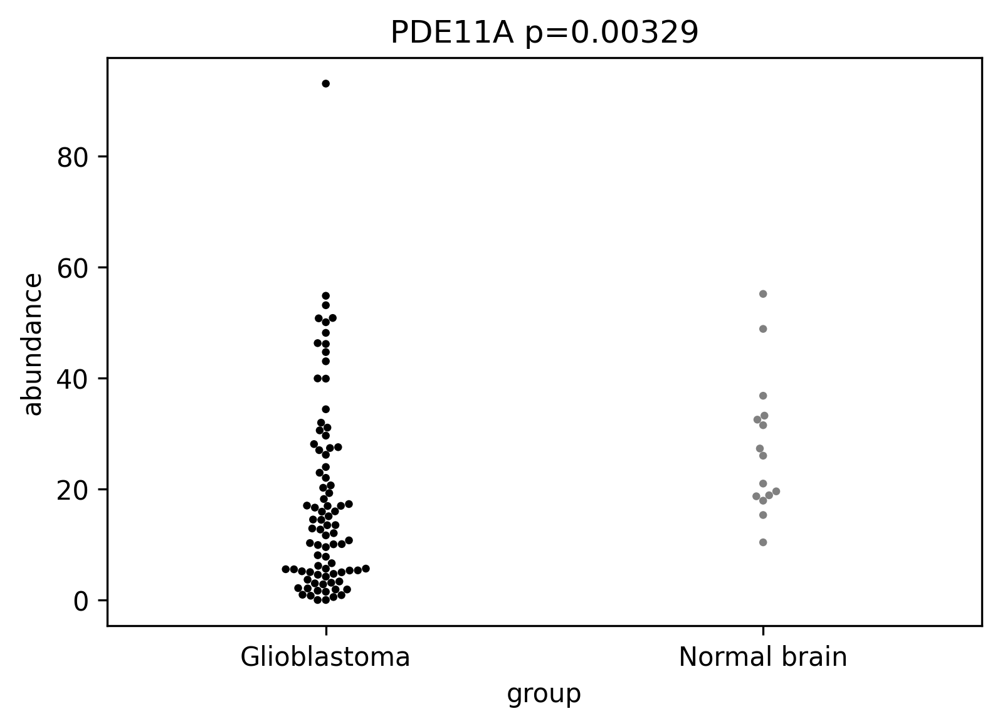

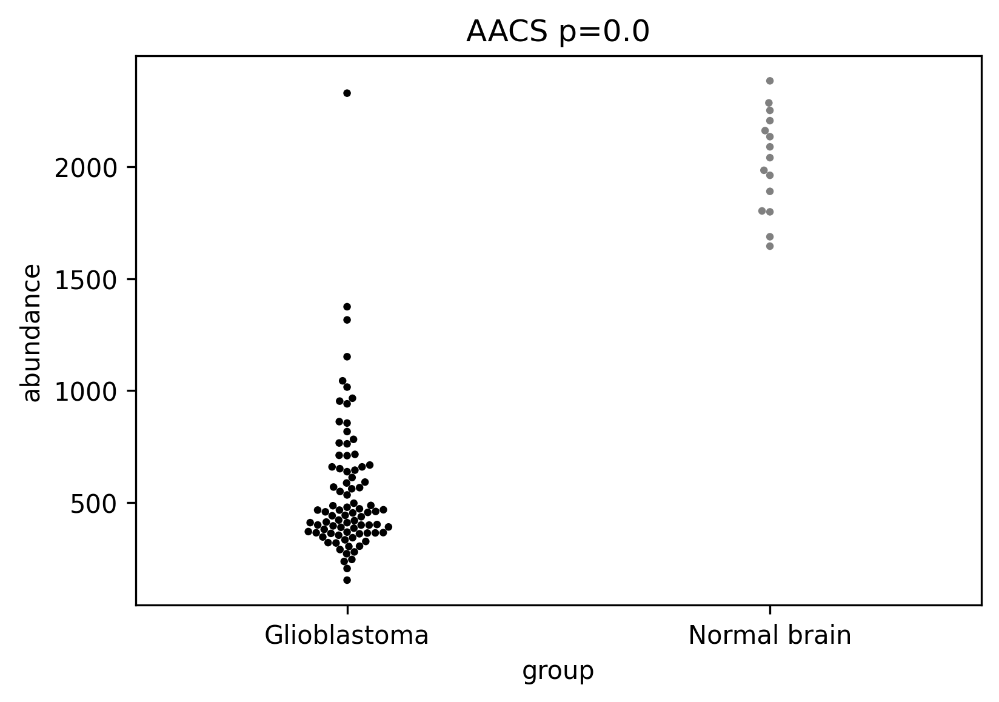

...

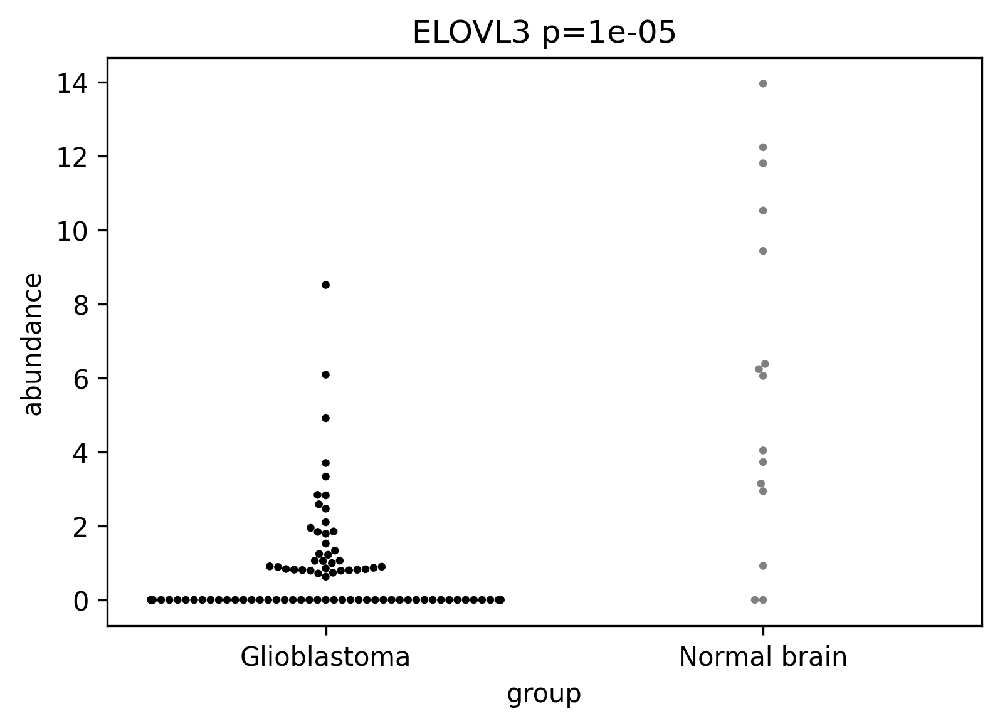

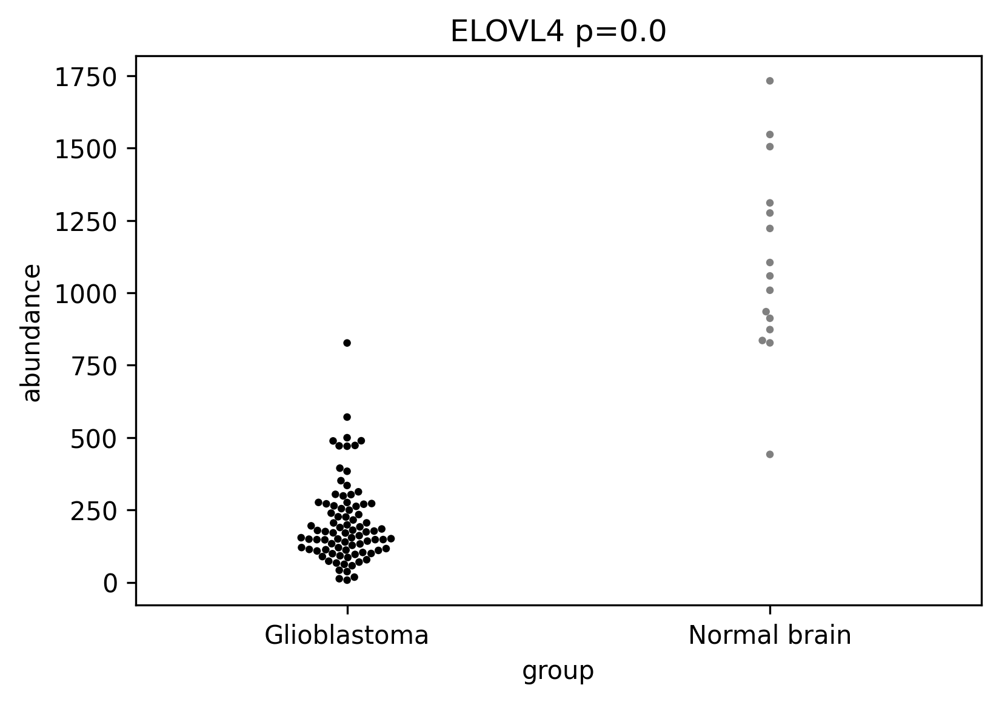

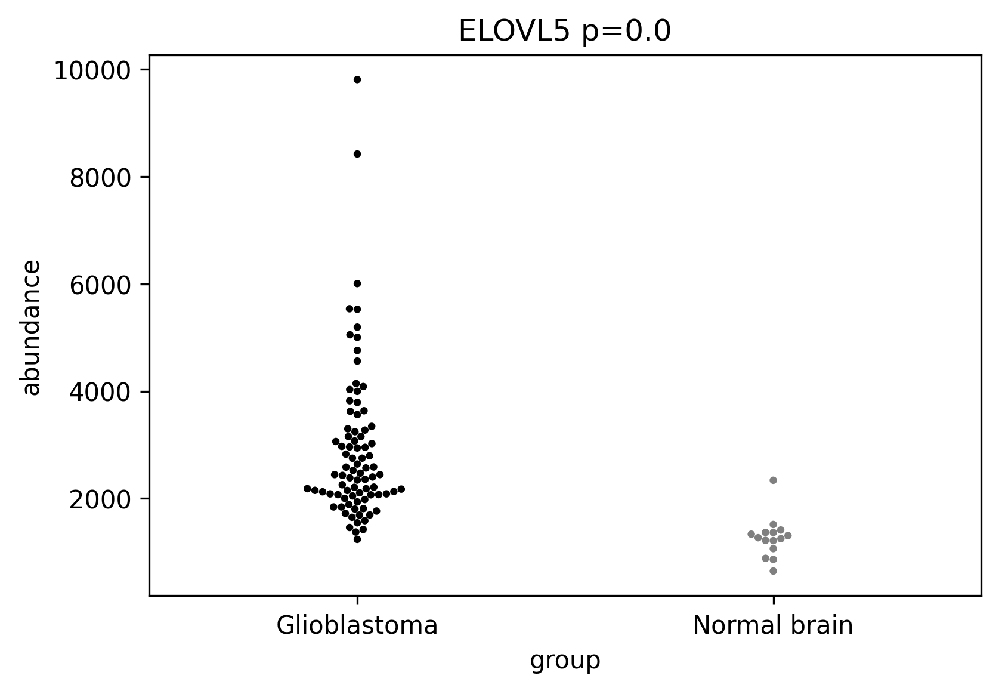

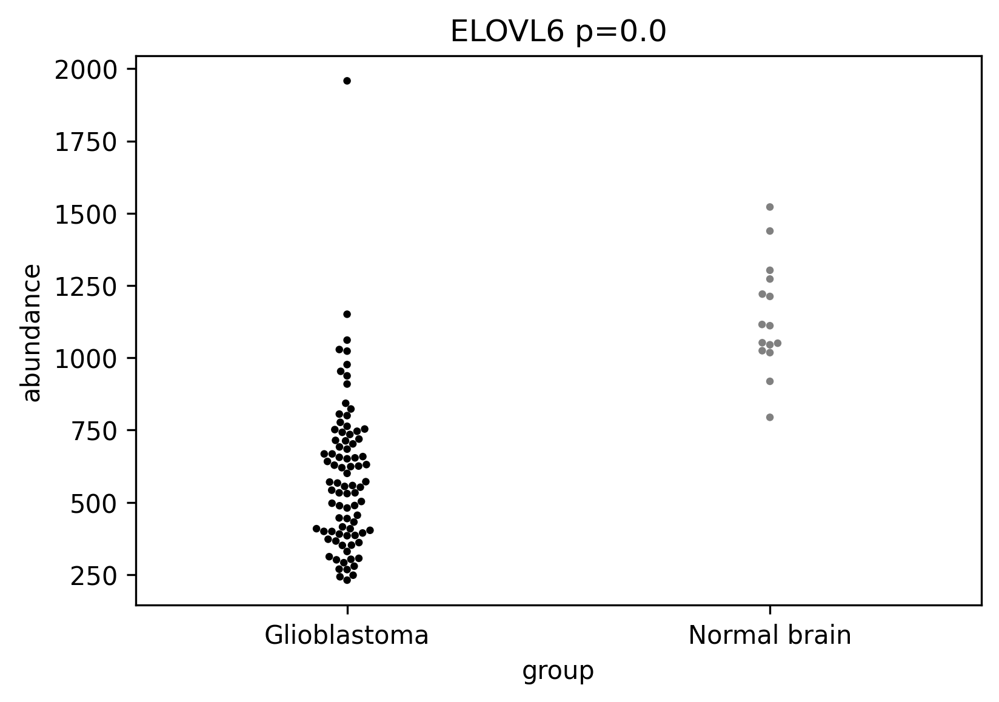

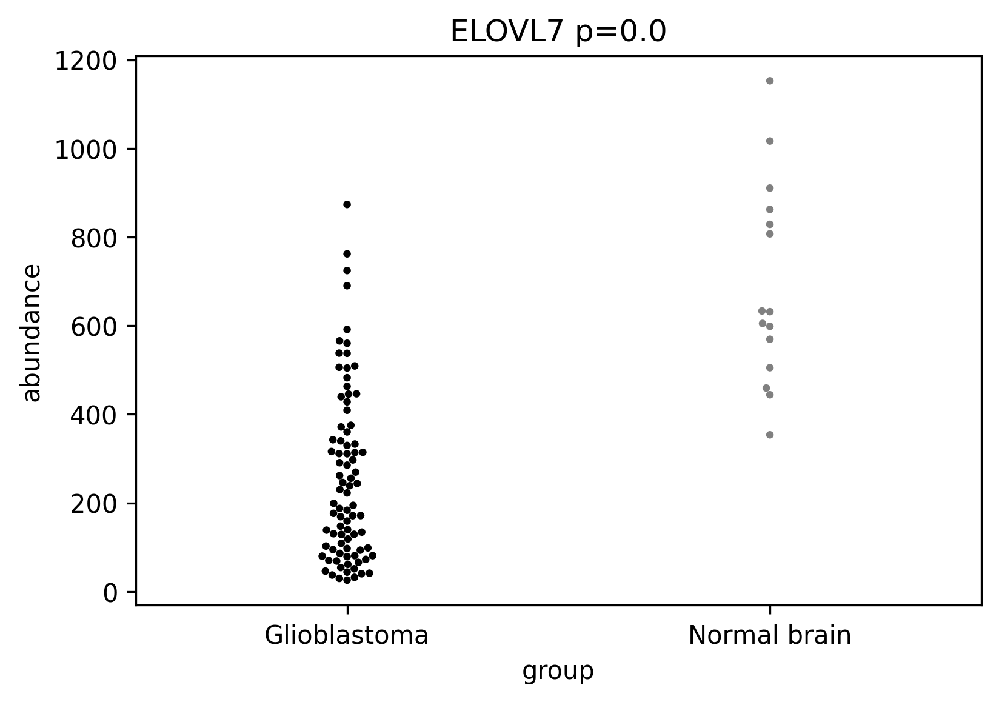

In [54]:
genelist = []
for _,genes in genesForMets.items():
   genelist += [symbols[x] for x in genes if x in symbols]
    
genelist.append("EGFR")
for x in range(1,8):
    genelist.append("ELOVL" + str(x))
for gene in genelist:
    plot_df = {}
    for samp in glioSamps:
        plot_df[len(plot_df)] = {"group":"Glioblastoma","gene":gene,"abundance":filtered.at[gene,rename[samp]]}
    for samp in contSamps:
        plot_df[len(plot_df)] = {"group":"Normal brain","gene":gene,"abundance":filtered.at[gene,rename[samp]]}

    plot_df = pd.DataFrame.from_dict(plot_df,orient="index")
    try:
        ints = [filtered.loc[gene,[rename[x] for x in glioSamps]].values,filtered.loc[gene,[rename[x] for x in contSamps]].values]
        stat,p = stats.ranksums(*ints)
        if p < 0.05:
            plt.figure()
            sb.swarmplot(data=plot_df,x="group",y="abundance",palette={"Glioblastoma":"black","Normal brain":"grey"},size=3)
            #sb.boxplot(data=plot_df,x="group",y="intensity",fliersize=0,palette={"Glioblastoma":"black","Normal brain":"grey"})
            plt.title(gene + " p=" + str(np.round(p,5)))
    except:
        pass
    

In [40]:
row.index.values

array(['Glioblastoma_0', 'Glioblastoma_1', 'Glioblastoma_2',
       'Glioblastoma_3', 'Glioblastoma_4', 'Glioblastoma_5',
       'Glioblastoma_6', 'Glioblastoma_7', 'Glioblastoma_8',
       'Glioblastoma_9', 'Glioblastoma_10', 'Glioblastoma_11',
       'Glioblastoma_12', 'Glioblastoma_13', 'Glioblastoma_14',
       'Glioblastoma_15', 'Glioblastoma_16', 'Glioblastoma_17',
       'Glioblastoma_18', 'Glioblastoma_19', 'Glioblastoma_20',
       'Glioblastoma_21', 'Glioblastoma_22', 'Glioblastoma_23',
       'Glioblastoma_24', 'Glioblastoma_25', 'Glioblastoma_26',
       'Glioblastoma_27', 'Glioblastoma_28', 'Glioblastoma_29',
       'Glioblastoma_30', 'Glioblastoma_31', 'Glioblastoma_32',
       'Glioblastoma_33', 'Glioblastoma_34', 'Glioblastoma_35',
       'Glioblastoma_36', 'Glioblastoma_37', 'Glioblastoma_38',
       'Glioblastoma_39', 'Glioblastoma_40', 'Glioblastoma_41',
       'Glioblastoma_42', 'Glioblastoma_43', 'Glioblastoma_44',
       'Glioblastoma_45', 'Glioblastoma_46', 'Glio

In [41]:
# processed_data = {}
# for subfold in os.listdir(datadir + assession):
#     if "Supp" in subfold:
#         files = os.listdir(datadir + assession + "/" + subfold)
#         matFile = [x for x in files if "_matrix" in x][0]
#         barcodeFile = [x for x in files if "_barcodes" in x][0]
#         featureFile = [x for x in files if "_features" in x][0]
#         mat = mmread(datadir + assession + "/" + subfold + "/" + matFile).toarray()
#         barcode = pd.read_csv(gzip.open(datadir + assession + "/" + subfold + "/" + barcodeFile),sep="\t",header=None)
#         features = pd.read_csv(gzip.open(datadir + assession + "/" + subfold + "/" + featureFile),sep="\t",header=None)
#         processed_data[subfold] = {"matrix":mat,"barcodes":barcode,"features":features}